In [8]:
import pandas as pd
import numpy as np
import scipy.stats as stats
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import datetime


### Ratio Metrics A/B test Design

Working with ratio metrics differs from cases with custom metrics. A ratio metric can be seen as an aggregation of two custom metrics. In this file, I will be examining the Average Order Value (sum of purchases / # of purchases). The specificity of ratio metrics is that, for comparing averages using a t-test, we cannot apply the traditional principle of 1 observation == 1 row because the data will be dependent, since one user tends to have higher Average Order Value than another. In this file, we will address this issue using a linearization approach, which will help transition from a ratio metric to a custom metric. We will calculate the design of our test and validate it with synthetic tests

In [9]:
# Let's import our Fake pre-experimental data in order to estimate the test design

df = pd.read_csv('/AB-testing/pre-experiment_data.csv')

df['order_date'] = pd.to_datetime(df['order_date'])
df = df[(df['order_date'] >= datetime(2023,11,6))
       & (df['order_date'] <= datetime(2023,11,19))]


def get_sample_size(mde, std, alpha, beta):
    numerator = 2 * (stats.norm.ppf(1-alpha/2) + stats.norm.ppf(1-beta))**2 * std**2
    denominator = mde**2
    return round(numerator / denominator)

def plot_pvalue_ecdf(pvalues, title=None):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

    if title:
        plt.suptitle(title)

    sns.histplot(pvalues, ax=ax1, bins=20, stat='density')
    ax1.plot([0,1],[1,1], 'k--')
    ax1.set(xlabel='p-value', ylabel='Density')

    sns.ecdfplot(pvalues, ax=ax2)
    ax2.plot([0,1],[0,1], 'k--')
    ax2.set(xlabel='p-value', ylabel='Probability')
    ax2.grid()

FileNotFoundError: [Errno 2] No such file or directory: '/AB-testing/pre-experiment_data.csv'

In [3]:
df.head(5)

,order_id,phone_number,order_type,revenue,order_date
15,0002dee6-1da3-4faf-83c0-dc36e3c50f66,+998973300015,COURIER,106000,2023-11-17
16,00065e74-4778-45e1-97e2-66e231aa28d2,+998938880534,COURIER,50000,2023-11-09
17,00072bdc-27bd-40f3-9a2f-357a87223a14,+998913697378,COURIER,99000,2023-11-10
18,0007eedc-f5da-4826-ad60-2f5de9079828,+998951670189,COURIER,92000,2023-11-06
19,00081c0d-3f38-4a57-85f6-071d843e0472,+998977733276,COURIER,89000,2023-11-14


In [4]:
# Для каждого клиента посчитаем его сумму покупок и количество покупок
df_grouped = df.groupby('phone_number')['revenue'].agg(['sum','count']).reset_index()

In [5]:
kappa = df_grouped['sum'].sum() / df_grouped['sum'].count()
print(kappa)

132594.45676274944


In [6]:
df_grouped['l_metric'] = df_grouped['sum'] - df_grouped['count'] * kappa
std_l = df_grouped['l_metric'].std()
print(std_l)

97344.65939354918


In [7]:
mde = 3000
mde_l = mde * df_grouped['count'].mean()
print(mde_l)

3628.874609710847


In [8]:
alpha = 0.05
beta = 0.1
sample_size = get_sample_size(mde_l, std_l, alpha, beta)
print(sample_size)

15122


In [9]:
df_grouped.shape[0]

44198

In [10]:
y_users = df_grouped.phone_number.to_list()
k_data = get_data(['2023-10-23', '2023-11-05'], ['DishDiscountSumInt'], ['Delivery.Id', 'Delivery.ServiceType','Delivery.Phone', 'OpenDate.Typed']) \
    .rename(columns = {'DishDiscountSumInt':'revenue', 'Delivery.Id':'order_id','Delivery.ServiceType':'order_type', 'Delivery.Phone':'phone_number', 'OpenDate.Typed':'order_date'}) \
    .query('order_type == "COURIER"')
k_data['order_date'] = pd.to_datetime(k_data['order_date'])
k_grouped = k_data.groupby('phone_number')['revenue'].agg(['sum','count']).reset_index()


In [11]:
k_grouped = k_grouped[k_grouped['phone_number'].isin(y_users)]
k_grouped['x'] = k_grouped['sum'] - k_grouped['count'] * kappa
df_grouped = df_grouped.rename(columns = {'l_metric':'y'}).merge(k_grouped[['phone_number', 'x']].rename(columns = {'l_metric':'x'}), how = 'left', on = 'phone_number').fillna(0)

In [12]:
def get_tetta(y,x):
    return np.cov(y,x)[0,1] / np.var(x)

tetta = get_tetta(df_grouped['y'], df_grouped['x'])
df_grouped['cuped_metric'] = df_grouped['y'] - tetta * (df_grouped['x'] - np.mean(df_grouped['x']))


In [13]:
df_grouped['cuped_metric'].std()

94204.09490735926

In [14]:
(97344.65939354918-94204.09490735926) / 97344.65939354918

0.03226231932758746

In [15]:
np.corrcoef(df_grouped['x'], df_grouped['y'])

array([[1.        , 0.25195988],
       [0.25195988, 1.        ]])

In [16]:
get_sample_size(mde_l, df_grouped['cuped_metric'].std(), alpha, beta)

14162

In [17]:
(15122-14162) / 15122

0.06348366618172199

In [18]:
15122-14162

960

In [40]:
def get_grouped(df):
    """
    Функция принимает сырой df с зависимыми данные и возвращает группированный df
    """
    df = df.groupby('phone_number')['revenue'].agg(['sum','count']).reset_index() \
        .rename(columns = {'phone_number':'user_id', 'sum':'x', 'count':'y'})
    return df
    
def get_kappa(x,y):
    """
    Функция принимает числитель и знаменатель метрики отношения и возвращает коэффициент kappa
    """
    return x.sum() / y.sum()

def get_l_metric(df, kappa):
    """
    Функция принимает сгруппированный pd.DataFrame где 1 строка == 1 клиент и
    возвращает df с линеаризированной метрикой. В таблице должны содержаться данные о группе юзера
    user_id:: id клиента
    group:: пилотная или контрольная группа 1,0
    x:: числитель метрики отношения
    y:: знаменталь метрики отношения
    
    return df
    """
    df['l_metric'] = df['x'] - df['y'] * kappa
    return df[['user_id', 'group', 'l_metric']]

def get_cuped(df):
    """
    Функция принимает pd.DataFrame где 1 строка == 1 клиент и возвращает значения
    cuped метрики
    
    group:: пилотная или контрольная группа 1,0
    user_id:: id клиента
    y:: метрика в экспериментальном периоде
    x:: ковариата
    
    return df
    """
    tetta = np.cov(df['y'],df['x'])[0,1] / np.var(df['x'])
    df['cuped_metric'] = df['y'] - tetta * (df['x'] - np.mean(df['x']))
    
    return df.rename(columns = {'group_x':'group'})[['user_id', 'group', 'cuped_metric']]

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/1489206582.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1


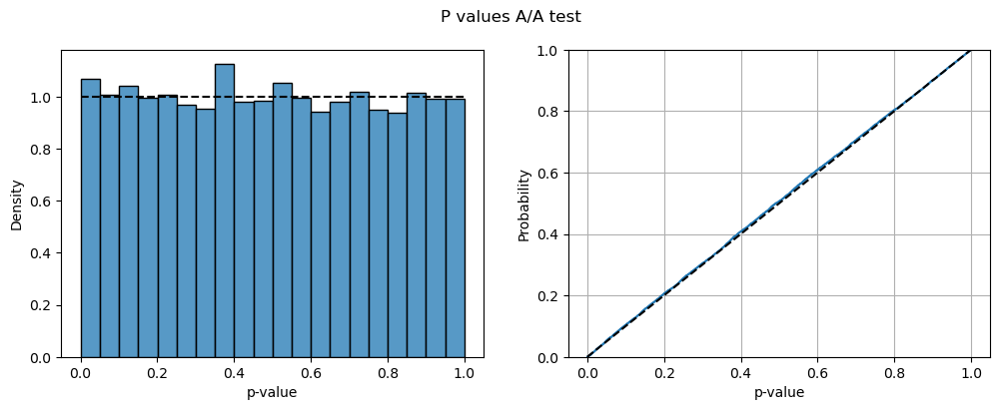

In [45]:
# A/A тест метрики отношения с применением linearization + cuped
sample_size = 14162

user_ids = df.phone_number.unique().tolist()
pvalues_aa = []
for _ in range(10000):
    np.random.shuffle(user_ids)
    a1, a2 = user_ids[:sample_size], user_ids[len(user_ids) - sample_size:]
    df_grouped = get_grouped(df)
    a1 = df_grouped[df_grouped['user_id'].isin(a1)]
    a1['group'] = 0
    a2 = df_grouped[df_grouped['user_id'].isin(a2)]
    a2['group'] = 1
    
    kappa = get_kappa(a1['x'], a1['y'])
    df_grouped = get_l_metric(pd.concat([a1, a2]), kappa)
    k_grouped = get_grouped(k_data) # пред-предэксперименталньный период
    k_grouped = k_grouped.merge(df_grouped[['user_id', 'group']], how = 'right', on = 'user_id').fillna(0)
    k_grouped = get_l_metric(k_grouped, kappa)
    df_grouped = get_cuped(df_grouped.rename(columns = {'l_metric':'y'}) \
                           .merge(k_grouped.rename(columns = {'l_metric':'x'})[['user_id', 'x']], on = 'user_id'))
    
    
    pvalue = stats.ttest_ind(df_grouped.query('group == 1').cuped_metric, df_grouped.query('group == 0').cuped_metric, alternative = 'two-sided').pvalue
    pvalues_aa.append(pvalue)
    
plot_pvalue_ecdf(pvalues_aa, title = 'P values A/A test')

0.0533

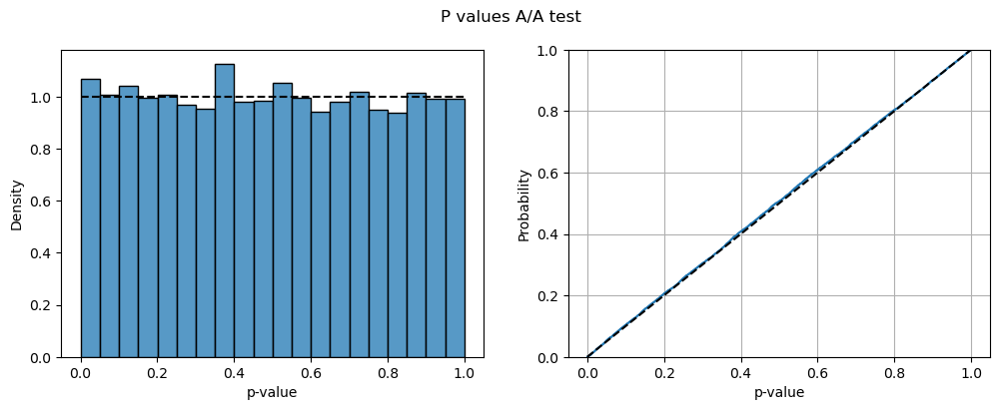

In [48]:
plot_pvalue_ecdf(pvalues_aa, title = 'P values A/A test')
(np.array(pvalues_aa) < alpha).mean()

0.0533

In [108]:
# A/B тест метрики отношения с применением linearization + cuped
sample_size = 14162
#sample_size = 12000

user_ids = df.phone_number.unique().tolist()
pvalues_ab = []

for i in tqdm(range(5000)):
    np.random.shuffle(user_ids)
    a, b = user_ids[:sample_size], user_ids[len(user_ids) - sample_size:]
    df_grouped = get_grouped(df)
    a = df_grouped[df_grouped['user_id'].isin(a)]
    a['group'] = 0
    b = df_grouped[df_grouped['user_id'].isin(b)]
    b['group'] = 1

    kappa = get_kappa(a['x'], a['y'])
    df_grouped = get_l_metric(pd.concat([a, b]), kappa)
    df_grouped['l_metric'] = df_grouped.apply(lambda row: row['l_metric'] if row['group'] == 0 else row['l_metric'] + mde_l, axis=1)
    k_grouped = get_grouped(k_data) # пред-предэксперименталньный период
    k_grouped = k_grouped.merge(df_grouped[['user_id', 'group']], how = 'right', on = 'user_id').fillna(0)
    k_grouped = get_l_metric(k_grouped, kappa)
    df_grouped = get_cuped(df_grouped.rename(columns = {'l_metric':'y'}) \
                           .merge(k_grouped.rename(columns = {'l_metric':'x'})[['user_id', 'x']], on = 'user_id'))


    pvalue = stats.ttest_ind(df_grouped.query('group == 1').cuped_metric, df_grouped.query('group == 0').cuped_metric, alternative = 'two-sided').pvalue
    pvalues_ab.append(pvalue)


  0%|                                                  | 0/5000 [00:00<?, ?it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
  0%|                                          | 1/5000 [00:00<14:18,  5.82it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

  0%|                                         | 10/5000 [00:01<13:30,  6.15it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
  0%|                                         | 11/5000 [00:01<13:24,  6.20it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

  0%|▏                                        | 20/5000 [00:03<13:25,  6.18it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
  0%|▏                                        | 21/5000 [00:03<13:23,  6.20it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

  1%|▏                                        | 30/5000 [00:04<12:59,  6.37it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
  1%|▎                                        | 31/5000 [00:04<13:12,  6.27it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

  1%|▎                                        | 40/5000 [00:06<13:20,  6.20it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
  1%|▎                                        | 41/5000 [00:06<13:17,  6.22it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

  1%|▍                                        | 50/5000 [00:08<13:14,  6.23it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
  1%|▍                                        | 51/5000 [00:08<13:04,  6.31it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

  1%|▍                                        | 60/5000 [00:09<12:52,  6.40it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
  1%|▌                                        | 61/5000 [00:09<13:05,  6.28it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

  1%|▌                                        | 70/5000 [00:11<12:54,  6.37it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
  1%|▌                                        | 71/5000 [00:11<12:50,  6.39it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

  2%|▋                                        | 80/5000 [00:12<13:36,  6.02it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
  2%|▋                                        | 81/5000 [00:12<13:49,  5.93it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

  2%|▋                                        | 90/5000 [00:14<13:26,  6.09it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
  2%|▋                                        | 91/5000 [00:14<13:18,  6.15it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

  2%|▊                                       | 100/5000 [00:16<13:11,  6.19it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
  2%|▊                                       | 101/5000 [00:16<13:17,  6.15it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

  2%|▉                                       | 110/5000 [00:17<13:12,  6.17it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
  2%|▉                                       | 111/5000 [00:17<13:11,  6.18it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

  2%|▉                                       | 120/5000 [00:19<12:54,  6.30it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
  2%|▉                                       | 121/5000 [00:19<12:54,  6.30it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

  3%|█                                       | 130/5000 [00:20<12:47,  6.35it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
  3%|█                                       | 131/5000 [00:20<12:47,  6.34it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

  3%|█                                       | 140/5000 [00:22<12:44,  6.36it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
  3%|█▏                                      | 141/5000 [00:22<12:41,  6.38it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

  3%|█▏                                      | 150/5000 [00:23<12:38,  6.39it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
  3%|█▏                                      | 151/5000 [00:24<12:39,  6.38it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

  3%|█▎                                      | 160/5000 [00:25<12:39,  6.38it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
  3%|█▎                                      | 161/5000 [00:25<12:36,  6.40it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

  3%|█▎                                      | 170/5000 [00:27<12:36,  6.39it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
  3%|█▎                                      | 171/5000 [00:27<12:35,  6.39it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

  4%|█▍                                      | 180/5000 [00:28<12:40,  6.34it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
  4%|█▍                                      | 181/5000 [00:28<12:35,  6.38it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

  4%|█▌                                      | 190/5000 [00:30<12:29,  6.41it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
  4%|█▌                                      | 191/5000 [00:30<12:28,  6.43it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

  4%|█▌                                      | 200/5000 [00:31<12:36,  6.35it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
  4%|█▌                                      | 201/5000 [00:31<12:32,  6.37it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

  4%|█▋                                      | 210/5000 [00:33<12:29,  6.39it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
  4%|█▋                                      | 211/5000 [00:33<12:28,  6.40it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

  4%|█▊                                      | 220/5000 [00:34<12:44,  6.25it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
  4%|█▊                                      | 221/5000 [00:35<12:39,  6.29it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

  5%|█▊                                      | 230/5000 [00:36<12:47,  6.22it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
  5%|█▊                                      | 231/5000 [00:36<12:55,  6.15it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

  5%|█▉                                      | 240/5000 [00:38<12:47,  6.20it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
  5%|█▉                                      | 241/5000 [00:38<12:38,  6.27it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

  5%|██                                      | 250/5000 [00:39<12:32,  6.31it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
  5%|██                                      | 251/5000 [00:39<12:53,  6.14it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

  5%|██                                      | 260/5000 [00:41<13:05,  6.03it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
  5%|██                                      | 261/5000 [00:41<13:05,  6.04it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

  5%|██▏                                     | 270/5000 [00:43<12:29,  6.31it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
  5%|██▏                                     | 271/5000 [00:43<12:42,  6.20it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

  6%|██▏                                     | 280/5000 [00:44<12:19,  6.38it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
  6%|██▏                                     | 281/5000 [00:44<12:16,  6.41it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

  6%|██▎                                     | 290/5000 [00:46<12:38,  6.21it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
  6%|██▎                                     | 291/5000 [00:46<12:30,  6.27it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

  6%|██▍                                     | 300/5000 [00:47<12:30,  6.27it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
  6%|██▍                                     | 301/5000 [00:47<12:29,  6.27it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

  6%|██▍                                     | 310/5000 [00:49<12:13,  6.39it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
  6%|██▍                                     | 311/5000 [00:49<12:21,  6.32it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

  6%|██▌                                     | 320/5000 [00:50<12:26,  6.27it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
  6%|██▌                                     | 321/5000 [00:51<12:25,  6.28it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

  7%|██▋                                     | 330/5000 [00:52<12:41,  6.13it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
  7%|██▋                                     | 331/5000 [00:52<12:34,  6.19it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

  7%|██▋                                     | 340/5000 [00:54<11:58,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
  7%|██▋                                     | 341/5000 [00:54<11:56,  6.50it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

  7%|██▊                                     | 350/5000 [00:55<11:58,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
  7%|██▊                                     | 351/5000 [00:55<11:58,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

  7%|██▉                                     | 360/5000 [00:57<11:58,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
  7%|██▉                                     | 361/5000 [00:57<11:56,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

  7%|██▉                                     | 370/5000 [00:58<12:02,  6.41it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
  7%|██▉                                     | 371/5000 [00:58<11:59,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

  8%|███                                     | 380/5000 [01:00<11:52,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
  8%|███                                     | 381/5000 [01:00<11:51,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

  8%|███                                     | 390/5000 [01:01<11:54,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
  8%|███▏                                    | 391/5000 [01:01<11:54,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

  8%|███▏                                    | 400/5000 [01:03<11:48,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
  8%|███▏                                    | 401/5000 [01:03<11:48,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

  8%|███▎                                    | 410/5000 [01:04<11:45,  6.50it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
  8%|███▎                                    | 411/5000 [01:05<11:45,  6.51it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

  8%|███▎                                    | 420/5000 [01:06<11:46,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
  8%|███▎                                    | 421/5000 [01:06<11:46,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

  9%|███▍                                    | 430/5000 [01:08<11:45,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
  9%|███▍                                    | 431/5000 [01:08<11:45,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

  9%|███▌                                    | 440/5000 [01:09<11:42,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
  9%|███▌                                    | 441/5000 [01:09<11:42,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

  9%|███▌                                    | 450/5000 [01:11<11:39,  6.50it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
  9%|███▌                                    | 451/5000 [01:11<11:39,  6.50it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

  9%|███▋                                    | 460/5000 [01:12<11:40,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
  9%|███▋                                    | 461/5000 [01:12<11:40,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

  9%|███▊                                    | 470/5000 [01:14<11:40,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
  9%|███▊                                    | 471/5000 [01:14<11:42,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 10%|███▊                                    | 480/5000 [01:15<11:37,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 10%|███▊                                    | 481/5000 [01:15<11:35,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 10%|███▉                                    | 490/5000 [01:17<11:36,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 10%|███▉                                    | 491/5000 [01:17<11:36,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 10%|████                                    | 500/5000 [01:18<11:31,  6.50it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 10%|████                                    | 501/5000 [01:18<11:31,  6.50it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 10%|████                                    | 510/5000 [01:20<11:34,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 10%|████                                    | 511/5000 [01:20<11:34,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 10%|████▏                                   | 520/5000 [01:21<11:30,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 10%|████▏                                   | 521/5000 [01:22<11:30,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 11%|████▏                                   | 530/5000 [01:23<11:29,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 11%|████▏                                   | 531/5000 [01:23<11:29,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 11%|████▎                                   | 540/5000 [01:25<11:27,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 11%|████▎                                   | 541/5000 [01:25<11:27,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 11%|████▍                                   | 550/5000 [01:26<11:25,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 11%|████▍                                   | 551/5000 [01:26<11:24,  6.50it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 11%|████▍                                   | 560/5000 [01:28<11:25,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 11%|████▍                                   | 561/5000 [01:28<11:25,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 11%|████▌                                   | 570/5000 [01:29<11:22,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 11%|████▌                                   | 571/5000 [01:29<11:23,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 12%|████▋                                   | 580/5000 [01:31<11:21,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 12%|████▋                                   | 581/5000 [01:31<11:21,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 12%|████▋                                   | 590/5000 [01:32<11:19,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 12%|████▋                                   | 591/5000 [01:32<11:18,  6.50it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 12%|████▊                                   | 600/5000 [01:34<11:18,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 12%|████▊                                   | 601/5000 [01:34<11:19,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 12%|████▉                                   | 610/5000 [01:35<11:18,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 12%|████▉                                   | 611/5000 [01:35<11:16,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 12%|████▉                                   | 620/5000 [01:37<11:16,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 12%|████▉                                   | 621/5000 [01:37<11:21,  6.42it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 13%|█████                                   | 630/5000 [01:38<11:13,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 13%|█████                                   | 631/5000 [01:39<11:13,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 13%|█████                                   | 640/5000 [01:40<11:22,  6.39it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 13%|█████▏                                  | 641/5000 [01:40<11:19,  6.41it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 13%|█████▏                                  | 650/5000 [01:41<11:08,  6.51it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 13%|█████▏                                  | 651/5000 [01:42<11:08,  6.51it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 13%|█████▎                                  | 660/5000 [01:43<11:08,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 13%|█████▎                                  | 661/5000 [01:43<11:10,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 13%|█████▎                                  | 670/5000 [01:45<11:06,  6.50it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 13%|█████▎                                  | 671/5000 [01:45<11:07,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 14%|█████▍                                  | 680/5000 [01:46<11:05,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 14%|█████▍                                  | 681/5000 [01:46<11:05,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 14%|█████▌                                  | 690/5000 [01:48<11:05,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 14%|█████▌                                  | 691/5000 [01:48<11:06,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 14%|█████▌                                  | 700/5000 [01:49<11:02,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 14%|█████▌                                  | 701/5000 [01:49<11:02,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 14%|█████▋                                  | 710/5000 [01:51<11:00,  6.50it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 14%|█████▋                                  | 711/5000 [01:51<10:59,  6.50it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 14%|█████▊                                  | 720/5000 [01:52<11:01,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 14%|█████▊                                  | 721/5000 [01:52<11:00,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 15%|█████▊                                  | 730/5000 [01:54<10:58,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 15%|█████▊                                  | 731/5000 [01:54<10:57,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 15%|█████▉                                  | 740/5000 [01:55<10:56,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 15%|█████▉                                  | 741/5000 [01:56<10:56,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 15%|██████                                  | 750/5000 [01:57<10:57,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 15%|██████                                  | 751/5000 [01:57<10:56,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 15%|██████                                  | 760/5000 [01:58<10:55,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 15%|██████                                  | 761/5000 [01:59<10:54,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 15%|██████▏                                 | 770/5000 [02:00<10:55,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 15%|██████▏                                 | 771/5000 [02:00<10:54,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 16%|██████▏                                 | 780/5000 [02:02<10:50,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 16%|██████▏                                 | 781/5000 [02:02<10:52,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 16%|██████▎                                 | 790/5000 [02:03<10:48,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 16%|██████▎                                 | 791/5000 [02:03<10:48,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 16%|██████▍                                 | 800/5000 [02:05<10:46,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 16%|██████▍                                 | 801/5000 [02:05<10:47,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 16%|██████▍                                 | 810/5000 [02:06<10:43,  6.51it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 16%|██████▍                                 | 811/5000 [02:06<10:45,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 16%|██████▌                                 | 820/5000 [02:08<10:45,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 16%|██████▌                                 | 821/5000 [02:08<10:47,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 17%|██████▋                                 | 830/5000 [02:09<10:55,  6.36it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 17%|██████▋                                 | 831/5000 [02:09<10:59,  6.33it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 17%|██████▋                                 | 840/5000 [02:11<10:41,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 17%|██████▋                                 | 841/5000 [02:11<10:40,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 17%|██████▊                                 | 850/5000 [02:12<10:40,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 17%|██████▊                                 | 851/5000 [02:13<10:40,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 17%|██████▉                                 | 860/5000 [02:14<10:38,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 17%|██████▉                                 | 861/5000 [02:14<10:38,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 17%|██████▉                                 | 870/5000 [02:15<10:36,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 17%|██████▉                                 | 871/5000 [02:16<10:37,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 18%|███████                                 | 880/5000 [02:17<10:34,  6.50it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 18%|███████                                 | 881/5000 [02:17<10:34,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 18%|███████                                 | 890/5000 [02:19<10:33,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 18%|███████▏                                | 891/5000 [02:19<10:33,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 18%|███████▏                                | 900/5000 [02:20<10:32,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 18%|███████▏                                | 901/5000 [02:20<10:30,  6.50it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 18%|███████▎                                | 910/5000 [02:22<10:31,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 18%|███████▎                                | 911/5000 [02:22<10:29,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 18%|███████▎                                | 920/5000 [02:23<10:28,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 18%|███████▎                                | 921/5000 [02:23<10:30,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 19%|███████▍                                | 930/5000 [02:25<10:28,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 19%|███████▍                                | 931/5000 [02:25<10:28,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 19%|███████▌                                | 940/5000 [02:26<10:31,  6.42it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 19%|███████▌                                | 941/5000 [02:26<10:30,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 19%|███████▌                                | 950/5000 [02:28<10:23,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 19%|███████▌                                | 951/5000 [02:28<10:23,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 19%|███████▋                                | 960/5000 [02:29<10:22,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 19%|███████▋                                | 961/5000 [02:29<10:22,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 19%|███████▊                                | 970/5000 [02:31<10:20,  6.50it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 19%|███████▊                                | 971/5000 [02:31<10:20,  6.50it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 20%|███████▊                                | 980/5000 [02:32<10:18,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 20%|███████▊                                | 981/5000 [02:33<10:18,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 20%|███████▉                                | 990/5000 [02:34<10:17,  6.50it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 20%|███████▉                                | 991/5000 [02:34<10:16,  6.50it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 20%|███████▊                               | 1000/5000 [02:35<10:15,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 20%|███████▊                               | 1001/5000 [02:36<10:16,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 20%|███████▉                               | 1010/5000 [02:37<10:13,  6.50it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 20%|███████▉                               | 1011/5000 [02:37<10:13,  6.50it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 20%|███████▉                               | 1020/5000 [02:39<10:12,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 20%|███████▉                               | 1021/5000 [02:39<10:14,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 21%|████████                               | 1030/5000 [02:40<10:13,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 21%|████████                               | 1031/5000 [02:40<10:13,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 21%|████████                               | 1040/5000 [02:42<10:07,  6.52it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 21%|████████                               | 1041/5000 [02:42<10:07,  6.51it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 21%|████████▏                              | 1050/5000 [02:43<10:09,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 21%|████████▏                              | 1051/5000 [02:43<10:08,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 21%|████████▎                              | 1060/5000 [02:45<10:08,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 21%|████████▎                              | 1061/5000 [02:45<10:09,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 21%|████████▎                              | 1070/5000 [02:46<10:04,  6.50it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 21%|████████▎                              | 1071/5000 [02:46<10:04,  6.50it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 22%|████████▍                              | 1080/5000 [02:48<10:04,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 22%|████████▍                              | 1081/5000 [02:48<10:04,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 22%|████████▌                              | 1090/5000 [02:49<10:01,  6.50it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 22%|████████▌                              | 1091/5000 [02:50<10:02,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 22%|████████▌                              | 1100/5000 [02:51<10:00,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 22%|████████▌                              | 1101/5000 [02:51<10:01,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 22%|████████▋                              | 1110/5000 [02:52<09:58,  6.50it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 22%|████████▋                              | 1111/5000 [02:53<09:58,  6.50it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 22%|████████▋                              | 1120/5000 [02:54<09:57,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 22%|████████▋                              | 1121/5000 [02:54<09:58,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 23%|████████▊                              | 1130/5000 [02:56<09:58,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 23%|████████▊                              | 1131/5000 [02:56<09:57,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 23%|████████▉                              | 1140/5000 [02:57<09:56,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 23%|████████▉                              | 1141/5000 [02:57<09:56,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 23%|████████▉                              | 1150/5000 [02:59<10:00,  6.41it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 23%|████████▉                              | 1151/5000 [02:59<09:58,  6.43it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 23%|█████████                              | 1160/5000 [03:00<09:52,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 23%|█████████                              | 1161/5000 [03:00<09:51,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 23%|█████████▏                             | 1170/5000 [03:02<09:50,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 23%|█████████▏                             | 1171/5000 [03:02<09:49,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 24%|█████████▏                             | 1180/5000 [03:03<09:47,  6.50it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 24%|█████████▏                             | 1181/5000 [03:03<09:48,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 24%|█████████▎                             | 1190/5000 [03:05<09:47,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 24%|█████████▎                             | 1191/5000 [03:05<09:48,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 24%|█████████▎                             | 1200/5000 [03:06<09:45,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 24%|█████████▎                             | 1201/5000 [03:06<09:45,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 24%|█████████▍                             | 1210/5000 [03:08<09:45,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 24%|█████████▍                             | 1211/5000 [03:08<09:44,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 24%|█████████▌                             | 1220/5000 [03:09<09:47,  6.43it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 24%|█████████▌                             | 1221/5000 [03:10<09:45,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 25%|█████████▌                             | 1230/5000 [03:11<09:42,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 25%|█████████▌                             | 1231/5000 [03:11<09:41,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 25%|█████████▋                             | 1240/5000 [03:13<09:41,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 25%|█████████▋                             | 1241/5000 [03:13<09:41,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 25%|█████████▊                             | 1250/5000 [03:14<09:37,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 25%|█████████▊                             | 1251/5000 [03:14<09:39,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 25%|█████████▊                             | 1260/5000 [03:16<09:46,  6.38it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 25%|█████████▊                             | 1261/5000 [03:16<09:48,  6.35it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 25%|█████████▉                             | 1270/5000 [03:17<09:36,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 25%|█████████▉                             | 1271/5000 [03:17<09:35,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 26%|█████████▉                             | 1280/5000 [03:19<09:34,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 26%|█████████▉                             | 1281/5000 [03:19<09:34,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 26%|██████████                             | 1290/5000 [03:20<09:31,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 26%|██████████                             | 1291/5000 [03:20<09:31,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 26%|██████████▏                            | 1300/5000 [03:22<09:30,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 26%|██████████▏                            | 1301/5000 [03:22<09:29,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 26%|██████████▏                            | 1310/5000 [03:23<09:28,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 26%|██████████▏                            | 1311/5000 [03:23<09:28,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 26%|██████████▎                            | 1320/5000 [03:25<09:27,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 26%|██████████▎                            | 1321/5000 [03:25<09:29,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 27%|██████████▎                            | 1330/5000 [03:26<09:26,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 27%|██████████▍                            | 1331/5000 [03:27<09:25,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 27%|██████████▍                            | 1340/5000 [03:28<09:23,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 27%|██████████▍                            | 1341/5000 [03:28<09:23,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 27%|██████████▌                            | 1350/5000 [03:30<09:22,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 27%|██████████▌                            | 1351/5000 [03:30<09:22,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 27%|██████████▌                            | 1360/5000 [03:31<09:22,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 27%|██████████▌                            | 1361/5000 [03:31<09:21,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 27%|██████████▋                            | 1370/5000 [03:33<09:18,  6.50it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 27%|██████████▋                            | 1371/5000 [03:33<09:18,  6.50it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 28%|██████████▊                            | 1380/5000 [03:34<09:18,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 28%|██████████▊                            | 1381/5000 [03:34<09:18,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 28%|██████████▊                            | 1390/5000 [03:36<09:15,  6.50it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 28%|██████████▊                            | 1391/5000 [03:36<09:14,  6.50it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 28%|██████████▉                            | 1400/5000 [03:37<09:12,  6.51it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 28%|██████████▉                            | 1401/5000 [03:37<09:12,  6.51it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 28%|██████████▉                            | 1410/5000 [03:39<09:12,  6.50it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 28%|███████████                            | 1411/5000 [03:39<09:11,  6.50it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 28%|███████████                            | 1420/5000 [03:40<09:11,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 28%|███████████                            | 1421/5000 [03:40<09:11,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 29%|███████████▏                           | 1430/5000 [03:42<09:19,  6.38it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 29%|███████████▏                           | 1431/5000 [03:42<09:17,  6.40it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 29%|███████████▏                           | 1440/5000 [03:43<09:10,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 29%|███████████▏                           | 1441/5000 [03:44<09:10,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 29%|███████████▎                           | 1450/5000 [03:45<09:05,  6.50it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 29%|███████████▎                           | 1451/5000 [03:45<09:06,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 29%|███████████▍                           | 1460/5000 [03:46<09:05,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 29%|███████████▍                           | 1461/5000 [03:47<09:05,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 29%|███████████▍                           | 1470/5000 [03:48<09:05,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 29%|███████████▍                           | 1471/5000 [03:48<09:04,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 30%|███████████▌                           | 1480/5000 [03:50<09:03,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 30%|███████████▌                           | 1481/5000 [03:50<09:01,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 30%|███████████▌                           | 1490/5000 [03:51<09:01,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 30%|███████████▋                           | 1491/5000 [03:51<09:00,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 30%|███████████▋                           | 1500/5000 [03:53<08:58,  6.50it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 30%|███████████▋                           | 1501/5000 [03:53<08:58,  6.50it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 30%|███████████▊                           | 1510/5000 [03:54<08:57,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 30%|███████████▊                           | 1511/5000 [03:54<08:58,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 30%|███████████▊                           | 1520/5000 [03:56<08:56,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 30%|███████████▊                           | 1521/5000 [03:56<08:56,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 31%|███████████▉                           | 1530/5000 [03:57<08:56,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 31%|███████████▉                           | 1531/5000 [03:57<08:55,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 31%|████████████                           | 1540/5000 [03:59<08:54,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 31%|████████████                           | 1541/5000 [03:59<08:53,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 31%|████████████                           | 1550/5000 [04:00<08:53,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 31%|████████████                           | 1551/5000 [04:01<08:53,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 31%|████████████▏                          | 1560/5000 [04:02<08:49,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 31%|████████████▏                          | 1561/5000 [04:02<08:49,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 31%|████████████▏                          | 1570/5000 [04:03<08:47,  6.50it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 31%|████████████▎                          | 1571/5000 [04:04<08:47,  6.51it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 32%|████████████▎                          | 1580/5000 [04:05<08:47,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 32%|████████████▎                          | 1581/5000 [04:05<08:46,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 32%|████████████▍                          | 1590/5000 [04:07<08:45,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 32%|████████████▍                          | 1591/5000 [04:07<08:44,  6.50it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 32%|████████████▍                          | 1600/5000 [04:08<09:05,  6.24it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 32%|████████████▍                          | 1601/5000 [04:08<09:04,  6.24it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 32%|████████████▌                          | 1610/5000 [04:10<09:01,  6.26it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 32%|████████████▌                          | 1611/5000 [04:10<08:56,  6.32it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 32%|████████████▋                          | 1620/5000 [04:11<09:33,  5.90it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 32%|████████████▋                          | 1621/5000 [04:12<09:37,  5.85it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 33%|████████████▋                          | 1630/5000 [04:13<09:32,  5.89it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 33%|████████████▋                          | 1631/5000 [04:13<09:35,  5.86it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 33%|████████████▊                          | 1640/5000 [04:15<09:02,  6.19it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 33%|████████████▊                          | 1641/5000 [04:15<09:14,  6.06it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 33%|████████████▊                          | 1650/5000 [04:16<08:47,  6.35it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 33%|████████████▉                          | 1651/5000 [04:17<08:44,  6.39it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 33%|████████████▉                          | 1660/5000 [04:18<08:36,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 33%|████████████▉                          | 1661/5000 [04:18<08:35,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 33%|█████████████                          | 1670/5000 [04:19<08:53,  6.24it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 33%|█████████████                          | 1671/5000 [04:20<08:56,  6.21it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 34%|█████████████                          | 1680/5000 [04:21<08:48,  6.28it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 34%|█████████████                          | 1681/5000 [04:21<08:52,  6.23it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 34%|█████████████▏                         | 1690/5000 [04:23<08:59,  6.13it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 34%|█████████████▏                         | 1691/5000 [04:23<08:57,  6.15it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 34%|█████████████▎                         | 1700/5000 [04:24<08:32,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 34%|█████████████▎                         | 1701/5000 [04:24<08:32,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 34%|█████████████▎                         | 1710/5000 [04:26<08:31,  6.43it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 34%|█████████████▎                         | 1711/5000 [04:26<08:50,  6.20it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 34%|█████████████▍                         | 1720/5000 [04:28<09:00,  6.07it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 34%|█████████████▍                         | 1721/5000 [04:28<08:51,  6.17it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 35%|█████████████▍                         | 1730/5000 [04:29<09:13,  5.91it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 35%|█████████████▌                         | 1731/5000 [04:29<09:15,  5.88it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 35%|█████████████▌                         | 1740/5000 [04:31<08:59,  6.04it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 35%|█████████████▌                         | 1741/5000 [04:31<08:58,  6.05it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 35%|█████████████▋                         | 1750/5000 [04:32<08:36,  6.29it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 35%|█████████████▋                         | 1751/5000 [04:33<08:43,  6.21it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 35%|█████████████▋                         | 1760/5000 [04:34<08:24,  6.43it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 35%|█████████████▋                         | 1761/5000 [04:34<08:22,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 35%|█████████████▊                         | 1770/5000 [04:36<08:31,  6.31it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 35%|█████████████▊                         | 1771/5000 [04:36<08:28,  6.35it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 36%|█████████████▉                         | 1780/5000 [04:37<08:19,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 36%|█████████████▉                         | 1781/5000 [04:37<08:26,  6.36it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 36%|█████████████▉                         | 1790/5000 [04:39<08:26,  6.34it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 36%|█████████████▉                         | 1791/5000 [04:39<08:33,  6.25it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 36%|██████████████                         | 1800/5000 [04:40<08:33,  6.23it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 36%|██████████████                         | 1801/5000 [04:41<08:41,  6.13it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 36%|██████████████                         | 1810/5000 [04:42<08:36,  6.18it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 36%|██████████████▏                        | 1811/5000 [04:42<08:32,  6.22it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 36%|██████████████▏                        | 1820/5000 [04:44<08:16,  6.41it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 36%|██████████████▏                        | 1821/5000 [04:44<08:18,  6.37it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 37%|██████████████▎                        | 1830/5000 [04:45<08:23,  6.30it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 37%|██████████████▎                        | 1831/5000 [04:45<08:19,  6.35it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 37%|██████████████▎                        | 1840/5000 [04:47<08:07,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 37%|██████████████▎                        | 1841/5000 [04:47<08:08,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 37%|██████████████▍                        | 1850/5000 [04:48<08:39,  6.06it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 37%|██████████████▍                        | 1851/5000 [04:48<08:44,  6.01it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 37%|██████████████▌                        | 1860/5000 [04:50<08:15,  6.33it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 37%|██████████████▌                        | 1861/5000 [04:50<08:16,  6.32it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 37%|██████████████▌                        | 1870/5000 [04:51<08:13,  6.34it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 37%|██████████████▌                        | 1871/5000 [04:52<08:14,  6.32it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 38%|██████████████▋                        | 1880/5000 [04:53<08:00,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 38%|██████████████▋                        | 1881/5000 [04:53<08:01,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 38%|██████████████▋                        | 1890/5000 [04:55<08:08,  6.37it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 38%|██████████████▋                        | 1891/5000 [04:55<08:11,  6.33it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 38%|██████████████▊                        | 1900/5000 [04:56<08:07,  6.35it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 38%|██████████████▊                        | 1901/5000 [04:56<08:11,  6.30it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 38%|██████████████▉                        | 1910/5000 [04:58<07:58,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 38%|██████████████▉                        | 1911/5000 [04:58<07:58,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 38%|██████████████▉                        | 1920/5000 [04:59<07:55,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 38%|██████████████▉                        | 1921/5000 [04:59<07:55,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 39%|███████████████                        | 1930/5000 [05:01<07:53,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 39%|███████████████                        | 1931/5000 [05:01<07:53,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 39%|███████████████▏                       | 1940/5000 [05:02<07:58,  6.40it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 39%|███████████████▏                       | 1941/5000 [05:03<08:25,  6.06it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 39%|███████████████▏                       | 1950/5000 [05:04<08:03,  6.31it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 39%|███████████████▏                       | 1951/5000 [05:04<08:03,  6.30it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 39%|███████████████▎                       | 1960/5000 [05:06<07:56,  6.38it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 39%|███████████████▎                       | 1961/5000 [05:06<07:58,  6.36it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 39%|███████████████▎                       | 1970/5000 [05:07<08:14,  6.12it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 39%|███████████████▎                       | 1971/5000 [05:07<08:16,  6.10it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 40%|███████████████▍                       | 1980/5000 [05:09<08:02,  6.26it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 40%|███████████████▍                       | 1981/5000 [05:09<07:59,  6.29it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 40%|███████████████▌                       | 1990/5000 [05:10<07:48,  6.43it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 40%|███████████████▌                       | 1991/5000 [05:11<07:46,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 40%|███████████████▌                       | 2000/5000 [05:12<07:41,  6.51it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 40%|███████████████▌                       | 2001/5000 [05:12<07:40,  6.51it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 40%|███████████████▋                       | 2010/5000 [05:13<07:42,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 40%|███████████████▋                       | 2011/5000 [05:14<07:42,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 40%|███████████████▊                       | 2020/5000 [05:15<07:41,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 40%|███████████████▊                       | 2021/5000 [05:15<07:41,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 41%|███████████████▊                       | 2030/5000 [05:17<07:39,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 41%|███████████████▊                       | 2031/5000 [05:17<07:38,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 41%|███████████████▉                       | 2040/5000 [05:18<07:37,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 41%|███████████████▉                       | 2041/5000 [05:18<07:40,  6.42it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 41%|███████████████▉                       | 2050/5000 [05:20<07:35,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 41%|███████████████▉                       | 2051/5000 [05:20<07:37,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 41%|████████████████                       | 2060/5000 [05:21<07:36,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 41%|████████████████                       | 2061/5000 [05:21<07:35,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 41%|████████████████▏                      | 2070/5000 [05:23<07:31,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 41%|████████████████▏                      | 2071/5000 [05:23<07:31,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 42%|████████████████▏                      | 2080/5000 [05:24<07:31,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 42%|████████████████▏                      | 2081/5000 [05:24<07:30,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 42%|████████████████▎                      | 2090/5000 [05:26<07:41,  6.30it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 42%|████████████████▎                      | 2091/5000 [05:26<07:41,  6.30it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 42%|████████████████▍                      | 2100/5000 [05:27<07:30,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 42%|████████████████▍                      | 2101/5000 [05:28<07:28,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 42%|████████████████▍                      | 2110/5000 [05:29<07:39,  6.29it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 42%|████████████████▍                      | 2111/5000 [05:29<07:35,  6.35it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 42%|████████████████▌                      | 2120/5000 [05:31<07:26,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 42%|████████████████▌                      | 2121/5000 [05:31<07:25,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 43%|████████████████▌                      | 2130/5000 [05:32<07:24,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 43%|████████████████▌                      | 2131/5000 [05:32<07:24,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 43%|████████████████▋                      | 2140/5000 [05:34<07:24,  6.43it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 43%|████████████████▋                      | 2141/5000 [05:34<07:24,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 43%|████████████████▊                      | 2150/5000 [05:35<07:21,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 43%|████████████████▊                      | 2151/5000 [05:35<07:21,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 43%|████████████████▊                      | 2160/5000 [05:37<07:19,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 43%|████████████████▊                      | 2161/5000 [05:37<07:18,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 43%|████████████████▉                      | 2170/5000 [05:38<07:16,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 43%|████████████████▉                      | 2171/5000 [05:38<07:16,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 44%|█████████████████                      | 2180/5000 [05:40<07:16,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 44%|█████████████████                      | 2181/5000 [05:40<07:15,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 44%|█████████████████                      | 2190/5000 [05:41<07:12,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 44%|█████████████████                      | 2191/5000 [05:42<07:12,  6.50it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 44%|█████████████████▏                     | 2200/5000 [05:43<07:12,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 44%|█████████████████▏                     | 2201/5000 [05:43<07:11,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 44%|█████████████████▏                     | 2210/5000 [05:45<07:15,  6.41it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 44%|█████████████████▏                     | 2211/5000 [05:45<07:13,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 44%|█████████████████▎                     | 2220/5000 [05:46<07:08,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 44%|█████████████████▎                     | 2221/5000 [05:46<07:08,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 45%|█████████████████▍                     | 2230/5000 [05:48<07:07,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 45%|█████████████████▍                     | 2231/5000 [05:48<07:07,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 45%|█████████████████▍                     | 2240/5000 [05:49<07:06,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 45%|█████████████████▍                     | 2241/5000 [05:49<07:06,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 45%|█████████████████▌                     | 2250/5000 [05:51<07:04,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 45%|█████████████████▌                     | 2251/5000 [05:51<07:05,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 45%|█████████████████▋                     | 2260/5000 [05:52<07:02,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 45%|█████████████████▋                     | 2261/5000 [05:52<07:02,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 45%|█████████████████▋                     | 2270/5000 [05:54<07:01,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 45%|█████████████████▋                     | 2271/5000 [05:54<07:01,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 46%|█████████████████▊                     | 2280/5000 [05:55<06:59,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 46%|█████████████████▊                     | 2281/5000 [05:56<06:59,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 46%|█████████████████▊                     | 2290/5000 [05:57<06:59,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 46%|█████████████████▊                     | 2291/5000 [05:57<06:58,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 46%|█████████████████▉                     | 2300/5000 [05:58<06:58,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 46%|█████████████████▉                     | 2301/5000 [05:59<06:57,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 46%|██████████████████                     | 2310/5000 [06:00<06:56,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 46%|██████████████████                     | 2311/5000 [06:00<06:55,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 46%|██████████████████                     | 2320/5000 [06:02<06:53,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 46%|██████████████████                     | 2321/5000 [06:02<06:53,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 47%|██████████████████▏                    | 2330/5000 [06:03<06:52,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 47%|██████████████████▏                    | 2331/5000 [06:03<06:51,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 47%|██████████████████▎                    | 2340/5000 [06:05<06:50,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 47%|██████████████████▎                    | 2341/5000 [06:05<06:49,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 47%|██████████████████▎                    | 2350/5000 [06:06<06:48,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 47%|██████████████████▎                    | 2351/5000 [06:06<06:48,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 47%|██████████████████▍                    | 2360/5000 [06:08<06:47,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 47%|██████████████████▍                    | 2361/5000 [06:08<06:47,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 47%|██████████████████▍                    | 2370/5000 [06:09<06:45,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 47%|██████████████████▍                    | 2371/5000 [06:09<06:45,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 48%|██████████████████▌                    | 2380/5000 [06:11<06:43,  6.50it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 48%|██████████████████▌                    | 2381/5000 [06:11<06:43,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 48%|██████████████████▋                    | 2390/5000 [06:12<06:41,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 48%|██████████████████▋                    | 2391/5000 [06:12<06:41,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 48%|██████████████████▋                    | 2400/5000 [06:14<06:41,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 48%|██████████████████▋                    | 2401/5000 [06:14<06:40,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 48%|██████████████████▊                    | 2410/5000 [06:15<06:40,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 48%|██████████████████▊                    | 2411/5000 [06:16<06:39,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 48%|██████████████████▉                    | 2420/5000 [06:17<06:37,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 48%|██████████████████▉                    | 2421/5000 [06:17<06:37,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 49%|██████████████████▉                    | 2430/5000 [06:19<06:36,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 49%|██████████████████▉                    | 2431/5000 [06:19<06:35,  6.50it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 49%|███████████████████                    | 2440/5000 [06:20<06:35,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 49%|███████████████████                    | 2441/5000 [06:20<06:35,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 49%|███████████████████                    | 2450/5000 [06:22<06:33,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 49%|███████████████████                    | 2451/5000 [06:22<06:32,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 49%|███████████████████▏                   | 2460/5000 [06:23<06:32,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 49%|███████████████████▏                   | 2461/5000 [06:23<06:31,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 49%|███████████████████▎                   | 2470/5000 [06:25<06:30,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 49%|███████████████████▎                   | 2471/5000 [06:25<06:31,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 50%|███████████████████▎                   | 2480/5000 [06:26<06:34,  6.40it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 50%|███████████████████▎                   | 2481/5000 [06:26<06:33,  6.41it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 50%|███████████████████▍                   | 2490/5000 [06:28<06:28,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 50%|███████████████████▍                   | 2491/5000 [06:28<06:28,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 50%|███████████████████▌                   | 2500/5000 [06:29<06:26,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 50%|███████████████████▌                   | 2501/5000 [06:29<06:30,  6.41it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 50%|███████████████████▌                   | 2510/5000 [06:31<06:23,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 50%|███████████████████▌                   | 2511/5000 [06:31<06:24,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 50%|███████████████████▋                   | 2520/5000 [06:32<06:22,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 50%|███████████████████▋                   | 2521/5000 [06:33<06:23,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 51%|███████████████████▋                   | 2530/5000 [06:34<06:21,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 51%|███████████████████▋                   | 2531/5000 [06:34<06:20,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 51%|███████████████████▊                   | 2540/5000 [06:36<06:20,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 51%|███████████████████▊                   | 2541/5000 [06:36<06:19,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 51%|███████████████████▉                   | 2550/5000 [06:37<06:17,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 51%|███████████████████▉                   | 2551/5000 [06:37<06:17,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 51%|███████████████████▉                   | 2560/5000 [06:39<06:17,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 51%|███████████████████▉                   | 2561/5000 [06:39<06:16,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 51%|████████████████████                   | 2570/5000 [06:40<06:16,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 51%|████████████████████                   | 2571/5000 [06:40<06:16,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 52%|████████████████████                   | 2580/5000 [06:42<06:13,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 52%|████████████████████▏                  | 2581/5000 [06:42<06:14,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 52%|████████████████████▏                  | 2590/5000 [06:43<06:12,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 52%|████████████████████▏                  | 2591/5000 [06:43<06:11,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 52%|████████████████████▎                  | 2600/5000 [06:45<06:10,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 52%|████████████████████▎                  | 2601/5000 [06:45<06:10,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 52%|████████████████████▎                  | 2610/5000 [06:46<06:08,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 52%|████████████████████▎                  | 2611/5000 [06:46<06:09,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 52%|████████████████████▍                  | 2620/5000 [06:48<06:08,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 52%|████████████████████▍                  | 2621/5000 [06:48<06:08,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 53%|████████████████████▌                  | 2630/5000 [06:49<06:07,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 53%|████████████████████▌                  | 2631/5000 [06:50<06:06,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 53%|████████████████████▌                  | 2640/5000 [06:51<06:04,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 53%|████████████████████▌                  | 2641/5000 [06:51<06:03,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 53%|████████████████████▋                  | 2650/5000 [06:53<06:05,  6.43it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 53%|████████████████████▋                  | 2651/5000 [06:53<06:03,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 53%|████████████████████▋                  | 2660/5000 [06:54<06:01,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 53%|████████████████████▊                  | 2661/5000 [06:54<06:01,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 53%|████████████████████▊                  | 2670/5000 [06:56<06:00,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 53%|████████████████████▊                  | 2671/5000 [06:56<06:00,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 54%|████████████████████▉                  | 2680/5000 [06:57<05:59,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 54%|████████████████████▉                  | 2681/5000 [06:57<05:58,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 54%|████████████████████▉                  | 2690/5000 [06:59<05:56,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 54%|████████████████████▉                  | 2691/5000 [06:59<05:56,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 54%|█████████████████████                  | 2700/5000 [07:00<05:55,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 54%|█████████████████████                  | 2701/5000 [07:00<05:55,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 54%|█████████████████████▏                 | 2710/5000 [07:02<05:54,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 54%|█████████████████████▏                 | 2711/5000 [07:02<05:55,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 54%|█████████████████████▏                 | 2720/5000 [07:03<05:52,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 54%|█████████████████████▏                 | 2721/5000 [07:04<05:52,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 55%|█████████████████████▎                 | 2730/5000 [07:05<05:50,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 55%|█████████████████████▎                 | 2731/5000 [07:05<05:50,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 55%|█████████████████████▎                 | 2740/5000 [07:06<05:49,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 55%|█████████████████████▍                 | 2741/5000 [07:07<05:49,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 55%|█████████████████████▍                 | 2750/5000 [07:08<05:47,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 55%|█████████████████████▍                 | 2751/5000 [07:08<05:48,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 55%|█████████████████████▌                 | 2760/5000 [07:10<05:45,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 55%|█████████████████████▌                 | 2761/5000 [07:10<05:45,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 55%|█████████████████████▌                 | 2770/5000 [07:11<05:48,  6.40it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 55%|█████████████████████▌                 | 2771/5000 [07:11<05:46,  6.43it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 56%|█████████████████████▋                 | 2780/5000 [07:13<05:42,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 56%|█████████████████████▋                 | 2781/5000 [07:13<05:42,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 56%|█████████████████████▊                 | 2790/5000 [07:14<05:41,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 56%|█████████████████████▊                 | 2791/5000 [07:14<05:49,  6.33it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 56%|█████████████████████▊                 | 2800/5000 [07:16<05:40,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 56%|█████████████████████▊                 | 2801/5000 [07:16<05:40,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 56%|█████████████████████▉                 | 2810/5000 [07:17<05:37,  6.50it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 56%|█████████████████████▉                 | 2811/5000 [07:17<05:37,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 56%|█████████████████████▉                 | 2820/5000 [07:19<05:36,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 56%|██████████████████████                 | 2821/5000 [07:19<05:36,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 57%|██████████████████████                 | 2830/5000 [07:20<05:35,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 57%|██████████████████████                 | 2831/5000 [07:21<05:35,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 57%|██████████████████████▏                | 2840/5000 [07:22<05:33,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 57%|██████████████████████▏                | 2841/5000 [07:22<05:33,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 57%|██████████████████████▏                | 2850/5000 [07:23<05:31,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 57%|██████████████████████▏                | 2851/5000 [07:24<05:31,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 57%|██████████████████████▎                | 2860/5000 [07:25<05:30,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 57%|██████████████████████▎                | 2861/5000 [07:25<05:30,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 57%|██████████████████████▍                | 2870/5000 [07:27<05:29,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 57%|██████████████████████▍                | 2871/5000 [07:27<05:28,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 58%|██████████████████████▍                | 2880/5000 [07:28<05:27,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 58%|██████████████████████▍                | 2881/5000 [07:28<05:26,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 58%|██████████████████████▌                | 2890/5000 [07:30<05:25,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 58%|██████████████████████▌                | 2891/5000 [07:30<05:25,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 58%|██████████████████████▌                | 2900/5000 [07:31<05:24,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 58%|██████████████████████▋                | 2901/5000 [07:31<05:24,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 58%|██████████████████████▋                | 2910/5000 [07:33<05:22,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 58%|██████████████████████▋                | 2911/5000 [07:33<05:22,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 58%|██████████████████████▊                | 2920/5000 [07:34<05:22,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 58%|██████████████████████▊                | 2921/5000 [07:34<05:21,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 59%|██████████████████████▊                | 2930/5000 [07:36<05:21,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 59%|██████████████████████▊                | 2931/5000 [07:36<05:20,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 59%|██████████████████████▉                | 2940/5000 [07:37<05:18,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 59%|██████████████████████▉                | 2941/5000 [07:38<05:17,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 59%|███████████████████████                | 2950/5000 [07:39<05:16,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 59%|███████████████████████                | 2951/5000 [07:39<05:16,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 59%|███████████████████████                | 2960/5000 [07:40<05:16,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 59%|███████████████████████                | 2961/5000 [07:41<05:15,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 59%|███████████████████████▏               | 2970/5000 [07:42<05:13,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 59%|███████████████████████▏               | 2971/5000 [07:42<05:13,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 60%|███████████████████████▏               | 2980/5000 [07:44<05:12,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 60%|███████████████████████▎               | 2981/5000 [07:44<05:12,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 60%|███████████████████████▎               | 2990/5000 [07:45<05:11,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 60%|███████████████████████▎               | 2991/5000 [07:45<05:11,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 60%|███████████████████████▍               | 3000/5000 [07:47<05:10,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 60%|███████████████████████▍               | 3001/5000 [07:47<05:09,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 60%|███████████████████████▍               | 3010/5000 [07:48<05:07,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 60%|███████████████████████▍               | 3011/5000 [07:48<05:06,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 60%|███████████████████████▌               | 3020/5000 [07:50<05:05,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 60%|███████████████████████▌               | 3021/5000 [07:50<05:05,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 61%|███████████████████████▋               | 3030/5000 [07:51<05:04,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 61%|███████████████████████▋               | 3031/5000 [07:51<05:03,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 61%|███████████████████████▋               | 3040/5000 [07:53<05:03,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 61%|███████████████████████▋               | 3041/5000 [07:53<05:03,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 61%|███████████████████████▊               | 3050/5000 [07:54<05:01,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 61%|███████████████████████▊               | 3051/5000 [07:55<05:01,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 61%|███████████████████████▊               | 3060/5000 [07:56<05:02,  6.41it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 61%|███████████████████████▉               | 3061/5000 [07:56<05:02,  6.42it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 61%|███████████████████████▉               | 3070/5000 [07:58<04:57,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 61%|███████████████████████▉               | 3071/5000 [07:58<04:57,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 62%|████████████████████████               | 3080/5000 [07:59<04:56,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 62%|████████████████████████               | 3081/5000 [07:59<04:56,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 62%|████████████████████████               | 3090/5000 [08:01<04:55,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 62%|████████████████████████               | 3091/5000 [08:01<04:54,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 62%|████████████████████████▏              | 3100/5000 [08:02<04:54,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 62%|████████████████████████▏              | 3101/5000 [08:02<04:53,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 62%|████████████████████████▎              | 3110/5000 [08:04<04:52,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 62%|████████████████████████▎              | 3111/5000 [08:04<04:53,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 62%|████████████████████████▎              | 3120/5000 [08:05<05:01,  6.24it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 62%|████████████████████████▎              | 3121/5000 [08:05<04:57,  6.31it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 63%|████████████████████████▍              | 3130/5000 [08:07<04:56,  6.30it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 63%|████████████████████████▍              | 3131/5000 [08:07<05:02,  6.19it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 63%|████████████████████████▍              | 3140/5000 [08:08<05:03,  6.12it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 63%|████████████████████████▍              | 3141/5000 [08:09<05:03,  6.12it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 63%|████████████████████████▌              | 3150/5000 [08:10<04:51,  6.34it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 63%|████████████████████████▌              | 3151/5000 [08:10<04:49,  6.38it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 63%|████████████████████████▋              | 3160/5000 [08:12<04:54,  6.24it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 63%|████████████████████████▋              | 3161/5000 [08:12<04:52,  6.30it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 63%|████████████████████████▋              | 3170/5000 [08:13<04:47,  6.36it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 63%|████████████████████████▋              | 3171/5000 [08:13<04:47,  6.36it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 64%|████████████████████████▊              | 3180/5000 [08:15<04:50,  6.26it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 64%|████████████████████████▊              | 3181/5000 [08:15<04:51,  6.24it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 64%|████████████████████████▉              | 3190/5000 [08:16<04:47,  6.29it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 64%|████████████████████████▉              | 3191/5000 [08:17<04:46,  6.31it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 64%|████████████████████████▉              | 3200/5000 [08:18<04:41,  6.38it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 64%|████████████████████████▉              | 3201/5000 [08:18<04:42,  6.37it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 64%|█████████████████████████              | 3210/5000 [08:20<04:55,  6.05it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 64%|█████████████████████████              | 3211/5000 [08:20<04:53,  6.10it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 64%|█████████████████████████              | 3220/5000 [08:21<04:57,  5.98it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 64%|█████████████████████████              | 3221/5000 [08:21<04:52,  6.08it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 65%|█████████████████████████▏             | 3230/5000 [08:23<04:41,  6.29it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 65%|█████████████████████████▏             | 3231/5000 [08:23<04:41,  6.29it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 65%|█████████████████████████▎             | 3240/5000 [08:25<04:44,  6.19it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 65%|█████████████████████████▎             | 3241/5000 [08:25<04:42,  6.23it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 65%|█████████████████████████▎             | 3250/5000 [08:26<04:33,  6.41it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 65%|█████████████████████████▎             | 3251/5000 [08:26<04:34,  6.36it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 65%|█████████████████████████▍             | 3260/5000 [08:28<04:31,  6.40it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 65%|█████████████████████████▍             | 3261/5000 [08:28<04:31,  6.41it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 65%|█████████████████████████▌             | 3270/5000 [08:29<04:32,  6.34it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 65%|█████████████████████████▌             | 3271/5000 [08:29<04:33,  6.33it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 66%|█████████████████████████▌             | 3280/5000 [08:31<04:42,  6.08it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 66%|█████████████████████████▌             | 3281/5000 [08:31<04:43,  6.07it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 66%|█████████████████████████▋             | 3290/5000 [08:32<04:28,  6.37it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 66%|█████████████████████████▋             | 3291/5000 [08:33<04:30,  6.32it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 66%|█████████████████████████▋             | 3300/5000 [08:34<04:23,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 66%|█████████████████████████▋             | 3301/5000 [08:34<04:25,  6.41it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 66%|█████████████████████████▊             | 3310/5000 [08:36<04:29,  6.27it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 66%|█████████████████████████▊             | 3311/5000 [08:36<04:27,  6.31it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 66%|█████████████████████████▉             | 3320/5000 [08:37<04:28,  6.26it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 66%|█████████████████████████▉             | 3321/5000 [08:37<04:30,  6.20it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 67%|█████████████████████████▉             | 3330/5000 [08:39<04:21,  6.38it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 67%|█████████████████████████▉             | 3331/5000 [08:39<04:20,  6.40it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 67%|██████████████████████████             | 3340/5000 [08:40<04:17,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 67%|██████████████████████████             | 3341/5000 [08:40<04:17,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 67%|██████████████████████████▏            | 3350/5000 [08:42<04:14,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 67%|██████████████████████████▏            | 3351/5000 [08:42<04:14,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 67%|██████████████████████████▏            | 3360/5000 [08:43<04:14,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 67%|██████████████████████████▏            | 3361/5000 [08:44<04:13,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 67%|██████████████████████████▎            | 3370/5000 [08:45<04:15,  6.39it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 67%|██████████████████████████▎            | 3371/5000 [08:45<04:14,  6.41it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 68%|██████████████████████████▎            | 3380/5000 [08:47<04:11,  6.43it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 68%|██████████████████████████▎            | 3381/5000 [08:47<04:12,  6.42it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 68%|██████████████████████████▍            | 3390/5000 [08:48<04:10,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 68%|██████████████████████████▍            | 3391/5000 [08:48<04:09,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 68%|██████████████████████████▌            | 3400/5000 [08:50<04:08,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 68%|██████████████████████████▌            | 3401/5000 [08:50<04:08,  6.42it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 68%|██████████████████████████▌            | 3410/5000 [08:51<04:05,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 68%|██████████████████████████▌            | 3411/5000 [08:51<04:06,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 68%|██████████████████████████▋            | 3420/5000 [08:53<04:05,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 68%|██████████████████████████▋            | 3421/5000 [08:53<04:04,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 69%|██████████████████████████▊            | 3430/5000 [08:54<04:03,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 69%|██████████████████████████▊            | 3431/5000 [08:54<04:03,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 69%|██████████████████████████▊            | 3440/5000 [08:56<04:01,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 69%|██████████████████████████▊            | 3441/5000 [08:56<04:01,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 69%|██████████████████████████▉            | 3450/5000 [08:57<04:00,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 69%|██████████████████████████▉            | 3451/5000 [08:58<04:00,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 69%|██████████████████████████▉            | 3460/5000 [08:59<03:59,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 69%|██████████████████████████▉            | 3461/5000 [08:59<03:58,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 69%|███████████████████████████            | 3470/5000 [09:01<03:57,  6.43it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 69%|███████████████████████████            | 3471/5000 [09:01<03:57,  6.43it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 70%|███████████████████████████▏           | 3480/5000 [09:02<03:55,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 70%|███████████████████████████▏           | 3481/5000 [09:02<03:55,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 70%|███████████████████████████▏           | 3490/5000 [09:04<03:53,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 70%|███████████████████████████▏           | 3491/5000 [09:04<03:53,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 70%|███████████████████████████▎           | 3500/5000 [09:05<03:51,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 70%|███████████████████████████▎           | 3501/5000 [09:05<03:51,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 70%|███████████████████████████▍           | 3510/5000 [09:07<03:51,  6.43it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 70%|███████████████████████████▍           | 3511/5000 [09:07<03:51,  6.43it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 70%|███████████████████████████▍           | 3520/5000 [09:08<03:49,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 70%|███████████████████████████▍           | 3521/5000 [09:08<03:49,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 71%|███████████████████████████▌           | 3530/5000 [09:10<03:47,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 71%|███████████████████████████▌           | 3531/5000 [09:10<03:47,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 71%|███████████████████████████▌           | 3540/5000 [09:11<03:47,  6.42it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 71%|███████████████████████████▌           | 3541/5000 [09:12<03:47,  6.43it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 71%|███████████████████████████▋           | 3550/5000 [09:13<03:44,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 71%|███████████████████████████▋           | 3551/5000 [09:13<03:44,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 71%|███████████████████████████▊           | 3560/5000 [09:14<03:43,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 71%|███████████████████████████▊           | 3561/5000 [09:15<03:42,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 71%|███████████████████████████▊           | 3570/5000 [09:16<03:41,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 71%|███████████████████████████▊           | 3571/5000 [09:16<03:40,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 72%|███████████████████████████▉           | 3580/5000 [09:18<03:40,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 72%|███████████████████████████▉           | 3581/5000 [09:18<03:39,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 72%|████████████████████████████           | 3590/5000 [09:19<03:39,  6.41it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 72%|████████████████████████████           | 3591/5000 [09:19<03:39,  6.42it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 72%|████████████████████████████           | 3600/5000 [09:21<03:37,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 72%|████████████████████████████           | 3601/5000 [09:21<03:37,  6.43it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 72%|████████████████████████████▏          | 3610/5000 [09:22<03:35,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 72%|████████████████████████████▏          | 3611/5000 [09:22<03:35,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 72%|████████████████████████████▏          | 3620/5000 [09:24<03:33,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 72%|████████████████████████████▏          | 3621/5000 [09:24<03:33,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 73%|████████████████████████████▎          | 3630/5000 [09:25<03:32,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 73%|████████████████████████████▎          | 3631/5000 [09:26<03:31,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 73%|████████████████████████████▍          | 3640/5000 [09:27<03:30,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 73%|████████████████████████████▍          | 3641/5000 [09:27<03:30,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 73%|████████████████████████████▍          | 3650/5000 [09:28<03:29,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 73%|████████████████████████████▍          | 3651/5000 [09:29<03:28,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 73%|████████████████████████████▌          | 3660/5000 [09:30<03:27,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 73%|████████████████████████████▌          | 3661/5000 [09:30<03:27,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 73%|████████████████████████████▋          | 3670/5000 [09:32<03:26,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 73%|████████████████████████████▋          | 3671/5000 [09:32<03:25,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 74%|████████████████████████████▋          | 3680/5000 [09:33<03:24,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 74%|████████████████████████████▋          | 3681/5000 [09:33<03:24,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 74%|████████████████████████████▊          | 3690/5000 [09:35<03:23,  6.43it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 74%|████████████████████████████▊          | 3691/5000 [09:35<03:23,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 74%|████████████████████████████▊          | 3700/5000 [09:36<03:20,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 74%|████████████████████████████▊          | 3701/5000 [09:36<03:20,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 74%|████████████████████████████▉          | 3710/5000 [09:38<03:32,  6.07it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 74%|████████████████████████████▉          | 3711/5000 [09:38<03:30,  6.14it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 74%|█████████████████████████████          | 3720/5000 [09:39<03:21,  6.36it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 74%|█████████████████████████████          | 3721/5000 [09:40<03:20,  6.38it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 75%|█████████████████████████████          | 3730/5000 [09:41<03:17,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 75%|█████████████████████████████          | 3731/5000 [09:41<03:16,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 75%|█████████████████████████████▏         | 3740/5000 [09:43<03:15,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 75%|█████████████████████████████▏         | 3741/5000 [09:43<03:15,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 75%|█████████████████████████████▎         | 3750/5000 [09:44<03:13,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 75%|█████████████████████████████▎         | 3751/5000 [09:44<03:13,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 75%|█████████████████████████████▎         | 3760/5000 [09:46<03:12,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 75%|█████████████████████████████▎         | 3761/5000 [09:46<03:12,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 75%|█████████████████████████████▍         | 3770/5000 [09:47<03:11,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 75%|█████████████████████████████▍         | 3771/5000 [09:47<03:10,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 76%|█████████████████████████████▍         | 3780/5000 [09:49<03:09,  6.42it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 76%|█████████████████████████████▍         | 3781/5000 [09:49<03:09,  6.42it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 76%|█████████████████████████████▌         | 3790/5000 [09:50<03:08,  6.42it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 76%|█████████████████████████████▌         | 3791/5000 [09:50<03:07,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 76%|█████████████████████████████▋         | 3800/5000 [09:52<03:07,  6.40it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 76%|█████████████████████████████▋         | 3801/5000 [09:52<03:06,  6.42it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 76%|█████████████████████████████▋         | 3810/5000 [09:53<03:04,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 76%|█████████████████████████████▋         | 3811/5000 [09:54<03:04,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 76%|█████████████████████████████▊         | 3820/5000 [09:55<03:03,  6.43it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 76%|█████████████████████████████▊         | 3821/5000 [09:55<03:03,  6.43it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 77%|█████████████████████████████▊         | 3830/5000 [09:57<03:03,  6.39it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 77%|█████████████████████████████▉         | 3831/5000 [09:57<03:02,  6.41it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 77%|█████████████████████████████▉         | 3840/5000 [09:58<02:59,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 77%|█████████████████████████████▉         | 3841/5000 [09:58<02:59,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 77%|██████████████████████████████         | 3850/5000 [10:00<02:58,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 77%|██████████████████████████████         | 3851/5000 [10:00<02:58,  6.42it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 77%|██████████████████████████████         | 3860/5000 [10:01<02:57,  6.42it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 77%|██████████████████████████████         | 3861/5000 [10:01<02:57,  6.42it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 77%|██████████████████████████████▏        | 3870/5000 [10:03<02:56,  6.39it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 77%|██████████████████████████████▏        | 3871/5000 [10:03<02:56,  6.39it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 78%|██████████████████████████████▎        | 3880/5000 [10:04<02:54,  6.43it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 78%|██████████████████████████████▎        | 3881/5000 [10:04<02:54,  6.43it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 78%|██████████████████████████████▎        | 3890/5000 [10:06<02:52,  6.42it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 78%|██████████████████████████████▎        | 3891/5000 [10:06<02:52,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 78%|██████████████████████████████▍        | 3900/5000 [10:07<02:50,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 78%|██████████████████████████████▍        | 3901/5000 [10:08<02:51,  6.42it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 78%|██████████████████████████████▍        | 3910/5000 [10:09<02:49,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 78%|██████████████████████████████▌        | 3911/5000 [10:09<02:48,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 78%|██████████████████████████████▌        | 3920/5000 [10:11<02:47,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 78%|██████████████████████████████▌        | 3921/5000 [10:11<02:47,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 79%|██████████████████████████████▋        | 3930/5000 [10:12<02:46,  6.43it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 79%|██████████████████████████████▋        | 3931/5000 [10:12<02:46,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 79%|██████████████████████████████▋        | 3940/5000 [10:14<02:44,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 79%|██████████████████████████████▋        | 3941/5000 [10:14<02:44,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 79%|██████████████████████████████▊        | 3950/5000 [10:15<02:43,  6.41it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 79%|██████████████████████████████▊        | 3951/5000 [10:15<02:43,  6.41it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 79%|██████████████████████████████▉        | 3960/5000 [10:17<02:41,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 79%|██████████████████████████████▉        | 3961/5000 [10:17<02:41,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 79%|██████████████████████████████▉        | 3970/5000 [10:18<02:39,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 79%|██████████████████████████████▉        | 3971/5000 [10:18<02:39,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 80%|███████████████████████████████        | 3980/5000 [10:20<02:37,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 80%|███████████████████████████████        | 3981/5000 [10:20<02:37,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 80%|███████████████████████████████        | 3990/5000 [10:21<02:37,  6.42it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 80%|███████████████████████████████▏       | 3991/5000 [10:22<02:37,  6.42it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 80%|███████████████████████████████▏       | 4000/5000 [10:23<02:35,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 80%|███████████████████████████████▏       | 4001/5000 [10:23<02:34,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 80%|███████████████████████████████▎       | 4010/5000 [10:24<02:34,  6.41it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 80%|███████████████████████████████▎       | 4011/5000 [10:25<02:34,  6.42it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 80%|███████████████████████████████▎       | 4020/5000 [10:26<02:33,  6.40it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 80%|███████████████████████████████▎       | 4021/5000 [10:26<02:33,  6.40it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 81%|███████████████████████████████▍       | 4030/5000 [10:28<02:30,  6.42it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 81%|███████████████████████████████▍       | 4031/5000 [10:28<02:30,  6.43it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 81%|███████████████████████████████▌       | 4040/5000 [10:29<02:29,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 81%|███████████████████████████████▌       | 4041/5000 [10:29<02:28,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 81%|███████████████████████████████▌       | 4050/5000 [10:31<02:27,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 81%|███████████████████████████████▌       | 4051/5000 [10:31<02:27,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 81%|███████████████████████████████▋       | 4060/5000 [10:32<02:25,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 81%|███████████████████████████████▋       | 4061/5000 [10:32<02:26,  6.42it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 81%|███████████████████████████████▋       | 4070/5000 [10:34<02:24,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 81%|███████████████████████████████▊       | 4071/5000 [10:34<02:24,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 82%|███████████████████████████████▊       | 4080/5000 [10:35<02:23,  6.43it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 82%|███████████████████████████████▊       | 4081/5000 [10:36<02:22,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 82%|███████████████████████████████▉       | 4090/5000 [10:37<02:21,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 82%|███████████████████████████████▉       | 4091/5000 [10:37<02:20,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 82%|███████████████████████████████▉       | 4100/5000 [10:39<02:25,  6.18it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 82%|███████████████████████████████▉       | 4101/5000 [10:39<02:26,  6.13it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 82%|████████████████████████████████       | 4110/5000 [10:40<02:19,  6.38it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 82%|████████████████████████████████       | 4111/5000 [10:40<02:19,  6.39it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 82%|████████████████████████████████▏      | 4120/5000 [10:42<02:16,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 82%|████████████████████████████████▏      | 4121/5000 [10:42<02:16,  6.43it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 83%|████████████████████████████████▏      | 4130/5000 [10:43<02:15,  6.43it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 83%|████████████████████████████████▏      | 4131/5000 [10:43<02:14,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 83%|████████████████████████████████▎      | 4140/5000 [10:45<02:12,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 83%|████████████████████████████████▎      | 4141/5000 [10:45<02:12,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 83%|████████████████████████████████▎      | 4150/5000 [10:46<02:11,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 83%|████████████████████████████████▍      | 4151/5000 [10:46<02:11,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 83%|████████████████████████████████▍      | 4160/5000 [10:48<02:10,  6.42it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 83%|████████████████████████████████▍      | 4161/5000 [10:48<02:10,  6.42it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 83%|████████████████████████████████▌      | 4170/5000 [10:49<02:08,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 83%|████████████████████████████████▌      | 4171/5000 [10:50<02:08,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 84%|████████████████████████████████▌      | 4180/5000 [10:51<02:06,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 84%|████████████████████████████████▌      | 4181/5000 [10:51<02:06,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 84%|████████████████████████████████▋      | 4190/5000 [10:53<02:05,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 84%|████████████████████████████████▋      | 4191/5000 [10:53<02:05,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 84%|████████████████████████████████▊      | 4200/5000 [10:54<02:03,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 84%|████████████████████████████████▊      | 4201/5000 [10:54<02:03,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 84%|████████████████████████████████▊      | 4210/5000 [10:56<02:01,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 84%|████████████████████████████████▊      | 4211/5000 [10:56<02:01,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 84%|████████████████████████████████▉      | 4220/5000 [10:57<02:00,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 84%|████████████████████████████████▉      | 4221/5000 [10:57<02:00,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 85%|████████████████████████████████▉      | 4230/5000 [10:59<01:58,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 85%|█████████████████████████████████      | 4231/5000 [10:59<01:58,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 85%|█████████████████████████████████      | 4240/5000 [11:00<01:57,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 85%|█████████████████████████████████      | 4241/5000 [11:00<01:57,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 85%|█████████████████████████████████▏     | 4250/5000 [11:02<01:56,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 85%|█████████████████████████████████▏     | 4251/5000 [11:02<01:56,  6.42it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 85%|█████████████████████████████████▏     | 4260/5000 [11:03<01:54,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 85%|█████████████████████████████████▏     | 4261/5000 [11:03<01:54,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 85%|█████████████████████████████████▎     | 4270/5000 [11:05<01:52,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 85%|█████████████████████████████████▎     | 4271/5000 [11:05<01:52,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 86%|█████████████████████████████████▍     | 4280/5000 [11:06<01:50,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 86%|█████████████████████████████████▍     | 4281/5000 [11:07<01:50,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 86%|█████████████████████████████████▍     | 4290/5000 [11:08<01:49,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 86%|█████████████████████████████████▍     | 4291/5000 [11:08<01:49,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 86%|█████████████████████████████████▌     | 4300/5000 [11:10<01:47,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 86%|█████████████████████████████████▌     | 4301/5000 [11:10<01:47,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 86%|█████████████████████████████████▌     | 4310/5000 [11:11<01:47,  6.41it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 86%|█████████████████████████████████▋     | 4311/5000 [11:11<01:47,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 86%|█████████████████████████████████▋     | 4320/5000 [11:13<01:44,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 86%|█████████████████████████████████▋     | 4321/5000 [11:13<01:44,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 87%|█████████████████████████████████▊     | 4330/5000 [11:14<01:43,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 87%|█████████████████████████████████▊     | 4331/5000 [11:14<01:43,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 87%|█████████████████████████████████▊     | 4340/5000 [11:16<01:41,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 87%|█████████████████████████████████▊     | 4341/5000 [11:16<01:41,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 87%|█████████████████████████████████▉     | 4350/5000 [11:17<01:40,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 87%|█████████████████████████████████▉     | 4351/5000 [11:17<01:39,  6.50it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 87%|██████████████████████████████████     | 4360/5000 [11:19<01:38,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 87%|██████████████████████████████████     | 4361/5000 [11:19<01:38,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 87%|██████████████████████████████████     | 4370/5000 [11:20<01:38,  6.38it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 87%|██████████████████████████████████     | 4371/5000 [11:20<01:38,  6.40it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 88%|██████████████████████████████████▏    | 4380/5000 [11:22<01:36,  6.41it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 88%|██████████████████████████████████▏    | 4381/5000 [11:22<01:36,  6.43it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 88%|██████████████████████████████████▏    | 4390/5000 [11:23<01:34,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 88%|██████████████████████████████████▏    | 4391/5000 [11:24<01:34,  6.43it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 88%|██████████████████████████████████▎    | 4400/5000 [11:25<01:34,  6.38it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 88%|██████████████████████████████████▎    | 4401/5000 [11:25<01:33,  6.39it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 88%|██████████████████████████████████▍    | 4410/5000 [11:27<01:31,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 88%|██████████████████████████████████▍    | 4411/5000 [11:27<01:30,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 88%|██████████████████████████████████▍    | 4420/5000 [11:28<01:29,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 88%|██████████████████████████████████▍    | 4421/5000 [11:28<01:29,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 89%|██████████████████████████████████▌    | 4430/5000 [11:30<01:27,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 89%|██████████████████████████████████▌    | 4431/5000 [11:30<01:27,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 89%|██████████████████████████████████▋    | 4440/5000 [11:31<01:26,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 89%|██████████████████████████████████▋    | 4441/5000 [11:31<01:26,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 89%|██████████████████████████████████▋    | 4450/5000 [11:33<01:25,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 89%|██████████████████████████████████▋    | 4451/5000 [11:33<01:24,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 89%|██████████████████████████████████▊    | 4460/5000 [11:34<01:23,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 89%|██████████████████████████████████▊    | 4461/5000 [11:34<01:23,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 89%|██████████████████████████████████▊    | 4470/5000 [11:36<01:21,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 89%|██████████████████████████████████▊    | 4471/5000 [11:36<01:21,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 90%|██████████████████████████████████▉    | 4480/5000 [11:37<01:20,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 90%|██████████████████████████████████▉    | 4481/5000 [11:38<01:19,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 90%|███████████████████████████████████    | 4490/5000 [11:39<01:19,  6.42it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 90%|███████████████████████████████████    | 4491/5000 [11:39<01:19,  6.42it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 90%|███████████████████████████████████    | 4500/5000 [11:40<01:17,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 90%|███████████████████████████████████    | 4501/5000 [11:41<01:17,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 90%|███████████████████████████████████▏   | 4510/5000 [11:42<01:16,  6.43it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 90%|███████████████████████████████████▏   | 4511/5000 [11:42<01:15,  6.43it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 90%|███████████████████████████████████▎   | 4520/5000 [11:44<01:14,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 90%|███████████████████████████████████▎   | 4521/5000 [11:44<01:14,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 91%|███████████████████████████████████▎   | 4530/5000 [11:45<01:12,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 91%|███████████████████████████████████▎   | 4531/5000 [11:45<01:12,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 91%|███████████████████████████████████▍   | 4540/5000 [11:47<01:11,  6.43it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 91%|███████████████████████████████████▍   | 4541/5000 [11:47<01:11,  6.43it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 91%|███████████████████████████████████▍   | 4550/5000 [11:48<01:09,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 91%|███████████████████████████████████▍   | 4551/5000 [11:48<01:09,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 91%|███████████████████████████████████▌   | 4560/5000 [11:50<01:08,  6.43it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 91%|███████████████████████████████████▌   | 4561/5000 [11:50<01:08,  6.43it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 91%|███████████████████████████████████▋   | 4570/5000 [11:51<01:06,  6.42it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 91%|███████████████████████████████████▋   | 4571/5000 [11:51<01:07,  6.39it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 92%|███████████████████████████████████▋   | 4580/5000 [11:53<01:05,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 92%|███████████████████████████████████▋   | 4581/5000 [11:53<01:04,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 92%|███████████████████████████████████▊   | 4590/5000 [11:54<01:03,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 92%|███████████████████████████████████▊   | 4591/5000 [11:55<01:03,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 92%|███████████████████████████████████▉   | 4600/5000 [11:56<01:01,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 92%|███████████████████████████████████▉   | 4601/5000 [11:56<01:01,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 92%|███████████████████████████████████▉   | 4610/5000 [11:58<01:00,  6.42it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 92%|███████████████████████████████████▉   | 4611/5000 [11:58<01:00,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 92%|████████████████████████████████████   | 4620/5000 [11:59<00:58,  6.51it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 92%|████████████████████████████████████   | 4621/5000 [11:59<00:58,  6.50it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 93%|████████████████████████████████████   | 4630/5000 [12:01<00:57,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 93%|████████████████████████████████████   | 4631/5000 [12:01<00:57,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 93%|████████████████████████████████████▏  | 4640/5000 [12:02<00:56,  6.42it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 93%|████████████████████████████████████▏  | 4641/5000 [12:02<00:55,  6.43it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 93%|████████████████████████████████████▎  | 4650/5000 [12:04<00:54,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 93%|████████████████████████████████████▎  | 4651/5000 [12:04<00:54,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 93%|████████████████████████████████████▎  | 4660/5000 [12:05<00:53,  6.41it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 93%|████████████████████████████████████▎  | 4661/5000 [12:05<00:52,  6.43it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 93%|████████████████████████████████████▍  | 4670/5000 [12:07<00:51,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 93%|████████████████████████████████████▍  | 4671/5000 [12:07<00:51,  6.42it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 94%|████████████████████████████████████▌  | 4680/5000 [12:08<00:49,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 94%|████████████████████████████████████▌  | 4681/5000 [12:09<00:49,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 94%|████████████████████████████████████▌  | 4690/5000 [12:10<00:48,  6.37it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 94%|████████████████████████████████████▌  | 4691/5000 [12:10<00:48,  6.39it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 94%|████████████████████████████████████▋  | 4700/5000 [12:12<00:46,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 94%|████████████████████████████████████▋  | 4701/5000 [12:12<00:46,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 94%|████████████████████████████████████▋  | 4710/5000 [12:13<00:44,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 94%|████████████████████████████████████▋  | 4711/5000 [12:13<00:44,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 94%|████████████████████████████████████▊  | 4720/5000 [12:15<00:43,  6.37it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 94%|████████████████████████████████████▊  | 4721/5000 [12:15<00:43,  6.38it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 95%|████████████████████████████████████▉  | 4730/5000 [12:16<00:41,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 95%|████████████████████████████████████▉  | 4731/5000 [12:16<00:41,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 95%|████████████████████████████████████▉  | 4740/5000 [12:18<00:40,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 95%|████████████████████████████████████▉  | 4741/5000 [12:18<00:40,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 95%|█████████████████████████████████████  | 4750/5000 [12:19<00:38,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 95%|█████████████████████████████████████  | 4751/5000 [12:19<00:38,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 95%|█████████████████████████████████████▏ | 4760/5000 [12:21<00:37,  6.41it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 95%|█████████████████████████████████████▏ | 4761/5000 [12:21<00:37,  6.42it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 95%|█████████████████████████████████████▏ | 4770/5000 [12:22<00:35,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 95%|█████████████████████████████████████▏ | 4771/5000 [12:23<00:35,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 96%|█████████████████████████████████████▎ | 4780/5000 [12:24<00:34,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 96%|█████████████████████████████████████▎ | 4781/5000 [12:24<00:33,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 96%|█████████████████████████████████████▎ | 4790/5000 [12:26<00:32,  6.43it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 96%|█████████████████████████████████████▎ | 4791/5000 [12:26<00:32,  6.40it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 96%|█████████████████████████████████████▍ | 4800/5000 [12:27<00:30,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 96%|█████████████████████████████████████▍ | 4801/5000 [12:27<00:30,  6.49it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 96%|█████████████████████████████████████▌ | 4810/5000 [12:29<00:29,  6.43it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 96%|█████████████████████████████████████▌ | 4811/5000 [12:29<00:29,  6.43it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 96%|█████████████████████████████████████▌ | 4820/5000 [12:30<00:27,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 96%|█████████████████████████████████████▌ | 4821/5000 [12:30<00:27,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 97%|█████████████████████████████████████▋ | 4830/5000 [12:32<00:26,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 97%|█████████████████████████████████████▋ | 4831/5000 [12:32<00:26,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 97%|█████████████████████████████████████▊ | 4840/5000 [12:33<00:24,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 97%|█████████████████████████████████████▊ | 4841/5000 [12:33<00:24,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 97%|█████████████████████████████████████▊ | 4850/5000 [12:35<00:23,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 97%|█████████████████████████████████████▊ | 4851/5000 [12:35<00:23,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 97%|█████████████████████████████████████▉ | 4860/5000 [12:36<00:21,  6.41it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 97%|█████████████████████████████████████▉ | 4861/5000 [12:37<00:21,  6.42it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 97%|█████████████████████████████████████▉ | 4870/5000 [12:38<00:20,  6.41it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 97%|█████████████████████████████████████▉ | 4871/5000 [12:38<00:20,  6.43it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 98%|██████████████████████████████████████ | 4880/5000 [12:39<00:18,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 98%|██████████████████████████████████████ | 4881/5000 [12:40<00:18,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 98%|██████████████████████████████████████▏| 4890/5000 [12:41<00:17,  6.30it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 98%|██████████████████████████████████████▏| 4891/5000 [12:41<00:17,  6.33it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 98%|██████████████████████████████████████▏| 4900/5000 [12:43<00:15,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 98%|██████████████████████████████████████▏| 4901/5000 [12:43<00:15,  6.50it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 98%|██████████████████████████████████████▎| 4910/5000 [12:44<00:13,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 98%|██████████████████████████████████████▎| 4911/5000 [12:44<00:13,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 98%|██████████████████████████████████████▍| 4920/5000 [12:46<00:12,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 98%|██████████████████████████████████████▍| 4921/5000 [12:46<00:12,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 99%|██████████████████████████████████████▍| 4930/5000 [12:47<00:10,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 99%|██████████████████████████████████████▍| 4931/5000 [12:47<00:10,  6.48it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 99%|██████████████████████████████████████▌| 4940/5000 [12:49<00:09,  6.36it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 99%|██████████████████████████████████████▌| 4941/5000 [12:49<00:09,  6.37it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 99%|██████████████████████████████████████▌| 4950/5000 [12:50<00:07,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 99%|██████████████████████████████████████▌| 4951/5000 [12:51<00:07,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 99%|██████████████████████████████████████▋| 4960/5000 [12:52<00:06,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 99%|██████████████████████████████████████▋| 4961/5000 [12:52<00:06,  6.47it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

 99%|██████████████████████████████████████▊| 4970/5000 [12:53<00:04,  6.40it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
 99%|██████████████████████████████████████▊| 4971/5000 [12:54<00:04,  6.39it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

100%|██████████████████████████████████████▊| 4980/5000 [12:55<00:03,  6.45it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
100%|██████████████████████████████████████▊| 4981/5000 [12:55<00:02,  6.46it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

100%|██████████████████████████████████████▉| 4990/5000 [12:57<00:01,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/3048208149.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1
100%|██████████████████████████████████████▉| 4991/5000 [12:57<00:01,  6.44it/s]/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/30

100%|███████████████████████████████████████| 5000/5000 [12:58<00:00,  6.42it/s]


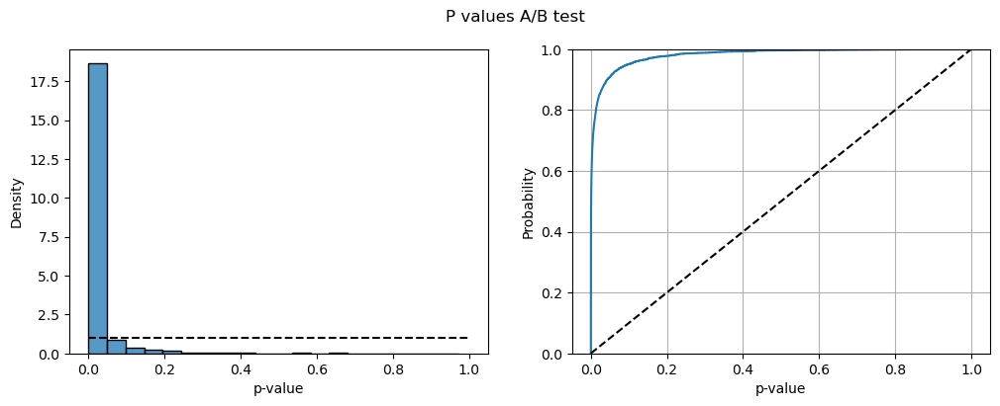

In [109]:
plot_pvalue_ecdf(pvalues_ab, title = 'P values A/B test')

In [110]:
(np.array(pvalues_ab) < alpha).mean()

0.9082

In [73]:
    np.random.shuffle(user_ids)
    a, b = user_ids[:sample_size], user_ids[len(user_ids) - sample_size:]
    df_grouped = get_grouped(df)
    a = df_grouped[df_grouped['user_id'].isin(a)]
    a['group'] = 0
    b = df_grouped[df_grouped['user_id'].isin(b)]
    b['group'] = 1

    kappa = get_kappa(a['x'], a['y'])
    df_grouped = get_l_metric(pd.concat([a, b]), kappa)
    df_grouped['l_metric'] = df_grouped.apply(lambda row: row['l_metric'] if row['group'] == 0 else row['l_metric'] + mde_l, axis=1)

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/178803346.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/178803346.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  b['group'] = 1


In [93]:
    np.random.shuffle(user_ids)
    a1, a2 = user_ids[:sample_size], user_ids[len(user_ids) - sample_size:]
    df_grouped = get_grouped(df)
    a1 = df_grouped[df_grouped['user_id'].isin(a1)]
    a1['group'] = 0
    a2 = df_grouped[df_grouped['user_id'].isin(a2)]
    a2['group'] = 1
    
    kappa = get_kappa(a1['x'], a1['y'])
    df_grouped = get_l_metric(pd.concat([a1, a2]), kappa)

/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/4157781713.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a1['group'] = 0
/var/folders/x2/1yrtlvcs1t141nf33scmy7280000gn/T/ipykernel_2465/4157781713.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  a2['group'] = 1


In [94]:
df_grouped.query('group == 0').l_metric.mean()

-9.864311975167474e-12

In [95]:
df_grouped.query('group == 1').l_metric.mean()

-190.20910272577527

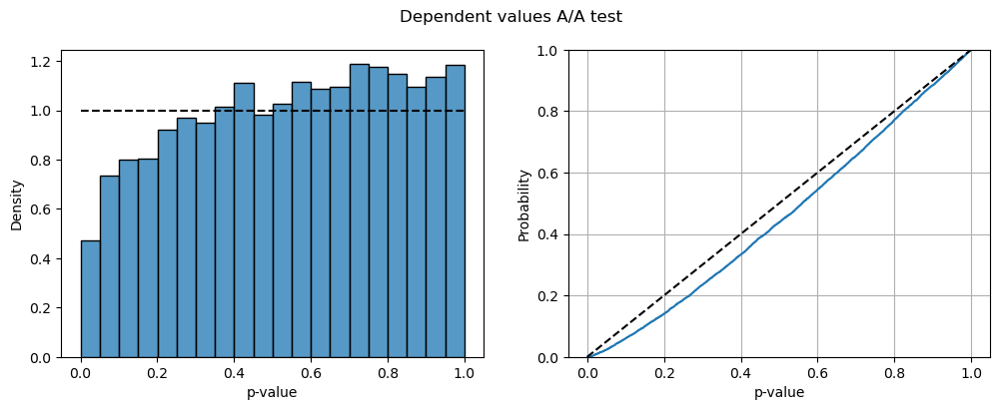

In [45]:
# Зависимые данные
user_ids = df.phone_number.to_list()
pvalues = []
for _ in range(10000):
    np.random.shuffle(user_ids)
    a1, a2 = user_ids[:len(user_ids) // 2], user_ids[len(user_ids) // 2:]
    a1_metric = df[df['phone_number'].isin(a1)].revenue
    a2_metric = df[df['phone_number'].isin(a2)].revenue
    pvalue = stats.ttest_ind(a1_metric, a2_metric, alternative = 'two-sided').pvalue
    pvalues.append(pvalue)
    
plot_pvalue_ecdf(pvalues, title = 'Dependent values A/A test')

In [46]:
(np.array(pvalues) < alpha).mean()

0.0234

In [48]:
exp_users = pd.read_csv('/Users/maksimkan/Downloads/experiment_users_linearizacia.csv')
logs = pd.read_csv('/Users/maksimkan/Downloads/web_logs_karpov.csv')
logs['date'] = pd.to_datetime(logs['date'])
logs = logs[(logs['date'] >= datetime(2022,4,5))
           & (logs['date'] < datetime(2022,4,12))]
users_list = exp_users.user_id.to_list()

In [49]:
logs_grouped = logs.groupby('user_id')['load_time'].agg(['sum', 'count'])

exp_users = exp_users.merge(logs_grouped, how = 'left', on = 'user_id')

In [50]:
kappa = exp_users.query('pilot == 0')['sum'].sum() / exp_users.query('pilot == 0')['count'].sum()
exp_users['l_metric'] = exp_users['sum'] - exp_users['count'] * kappa
p_value = stats.ttest_ind(exp_users.query('pilot == 1').l_metric, exp_users.query('pilot == 0').l_metric, alternative = 'two-sided').pvalue
print(p_value)

0.04416800272407419
